In [1]:
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np

from tqdm.notebook import tqdm


from networks import DeepSurv, NegativeLogLikelihood
from utils import c_index
import torch

In [2]:
device = 'cuda:0'

In [3]:
config = {'train': {
  'learning_rate': 0.0001,
  'lr_decay_rate': 0.2,
  'optimizer': 'Adam'},
 'network': {'drop': 0.5,
  'norm': True,
  'dims': [9,64,64,32,1],
  'activation': 'ReLU',
  'l2_reg': 0.1}}

model = DeepSurv(config['network'], device)
#print(model)

loss_function = NegativeLogLikelihood(config['network']).to(device)
#print(loss_function)


In [4]:
optimizer = eval('torch.optim.{}'.format(config['train']['optimizer']))(
        model.parameters(), lr=config['train']['learning_rate'])

In [5]:

from sksurv.datasets import load_gbsg2
data_x, data_y = load_gbsg2()
life = pd.concat([data_x, pd.DataFrame(data_y)], axis = 1)
from sksurv.preprocessing import OneHotEncoder

life = OneHotEncoder().fit_transform(life)

life


,age,estrec,horTh=yes,menostat=Post,pnodes,progrec,tgrade=II,tgrade=III,tsize,cens,time
0,70.0,66.0,0.0,1.0,3.0,48.0,1.0,0.0,21.0,True,1814.0
1,56.0,77.0,1.0,1.0,7.0,61.0,1.0,0.0,12.0,True,2018.0
2,58.0,271.0,1.0,1.0,9.0,52.0,1.0,0.0,35.0,True,712.0
3,59.0,29.0,1.0,1.0,4.0,60.0,1.0,0.0,17.0,True,1807.0
4,73.0,65.0,0.0,1.0,1.0,26.0,1.0,0.0,35.0,True,772.0
...,...,...,...,...,...,...,...,...,...,...,...
681,49.0,84.0,0.0,0.0,3.0,1.0,0.0,1.0,30.0,False,721.0
682,53.0,0.0,1.0,1.0,17.0,0.0,0.0,1.0,25.0,False,186.0
683,51.0,0.0,0.0,0.0,5.0,43.0,0.0,1.0,25.0,True,769.0
684,52.0,34.0,0.0,1.0,3.0,15.0,1.0,0.0,23.0,True,727.0


In [6]:
class SurvivalDataset(torch.utils.data.Dataset):
    
    def __init__(self, covx, event, time):
        '''
        note that inputs are normalized numpy
        '''
        self.covx = covx
        self.event = event
        self.time = time
        print(covx.shape, event.shape, time.shape)
    
    def __getitem__(self, index):
        # gets data with index of item
        X_item = self.covx[index] # (m)
        e_item = self.event[index] # (1)
        y_item = self.time[index] # (1)

        # constructs torch.Tensor object
        X_tensor = torch.from_numpy(X_item).to(torch.float32)
        e_tensor = torch.from_numpy(e_item).to(torch.float32)
        y_tensor = torch.from_numpy(y_item).to(torch.float32)
        return X_tensor, y_tensor, e_tensor

    def __len__(self):
        return self.covx.shape[0]

In [7]:
cols = list(life.columns)

cols.remove('cens')
cols.remove('time')
covx = life

import pandas as pd
from sklearn import preprocessing

x = covx.values #returns a numpy array
min_max_scaler = preprocessing.MinMaxScaler()
x_scaled = min_max_scaler.fit_transform(x)
df = pd.DataFrame(x_scaled)
covx, event, time = df[list(range(9))].to_numpy(), df[[9]].to_numpy(), df[[10]].to_numpy()

In [8]:
ratio = 0.9
train_valid_dataset = SurvivalDataset(covx[:550, :], event[:550], time[:550])

train_len = int(len(train_valid_dataset)*ratio)
valid_len = len(train_valid_dataset) - train_len

train_dataset, valid_dataset = torch.utils.data.random_split(train_valid_dataset, [train_len, valid_len])

train_loader = torch.utils.data.DataLoader(
    train_dataset, batch_size=train_dataset.__len__())
valid_loader = torch.utils.data.DataLoader(
    valid_dataset, batch_size=valid_dataset.__len__())



test_dataset = SurvivalDataset(covx[550:, :], event[550:], time[550:])
test_loader = torch.utils.data.DataLoader(
    test_dataset, batch_size=test_dataset.__len__())

print(train_dataset.__len__(), valid_dataset.__len__(), test_dataset.__len__())

(550, 9) (550, 1) (550, 1)
(136, 9) (136, 1) (136, 1)
495 55 136


In [9]:
class Trainer():
    def initialize(self, train_loader, valid_loader, test_loader, optimizer, model, loss_function, c_index_function, device, freq = 100):
        self.train_loader = train_loader
        self.valid_loader = valid_loader
        self.test_loader = test_loader
        self.optimizer = optimizer
        self.model = model.to(device)
        self.loss_function = loss_function.to(device)
        self.c_index_function = c_index_function
        self.device = device
        self.freq = freq
    
    def one_epoch_train(self, epoch):
        self.model.train()
        loss_total = list()
        c_index_total = list()
        for x, y, e in self.train_loader:
            x = x.to(self.device)
            y = y.to(self.device)
            e = e.to(self.device)
            risk_pred = self.model(x)
            train_loss = self.loss_function(risk_pred, y, e, self.model, self.device)
            train_c = self.c_index_function(-risk_pred, y, e)

            self.optimizer.zero_grad()
            train_loss.backward()
            self.optimizer.step()

            loss_total.append(train_loss.cpu().detach().item())
            c_index_total.append(train_c)

        return np.array(loss_total).mean(), np.array(c_index_total).mean()
    
    def one_epoch_valid(self, epoch):
        self.model.eval()
        loss_total = list()
        c_index_total = list()
        with torch.no_grad():
            for x, y, e in self.valid_loader:
                x = x.to(self.device)
                y = y.to(self.device)
                e = e.to(self.device)

                risk_pred = self.model(x).to(self.device)
                valid_loss = self.loss_function(risk_pred, y, e, self.model, self.device)
                valid_c = self.c_index_function(-risk_pred, y, e)

                loss_total.append(valid_loss.cpu().detach().item())
                c_index_total.append(valid_c)


            return np.array(loss_total).mean(), np.array(c_index_total).mean()

    def test(self):
        self.model.eval()
        with torch.no_grad():
            for x, y, e in self.test_loader:
                x = x.to(self.device)
                y = y.to(self.device)
                e = e.to(self.device)

                risk_pred = self.model(x).to(self.device)
                test_loss = self.loss_function(risk_pred, y, e, self.model, self.device)
                test_c = self.c_index_function(-risk_pred, y, e)


                print(f'Test || loss : {round(test_loss.cpu().detach().item(), 3)} / c-index : {round(test_c, 3)}')

In [10]:
trainer = Trainer()
trainer.initialize(
    train_loader,
    valid_loader, 
    test_loader,
    optimizer,
    model,
    loss_function,
    c_index_function = c_index,
    device = 'cuda:0'
)

In [11]:
epochs = 6000
train_result = list()
valid_result = list()
for epoch in tqdm(range(epochs)):
    train_result.append(trainer.one_epoch_train(epoch))
    valid_result.append(trainer.one_epoch_valid(epoch))
trainer.test()

train_result = np.stack(train_result)
valid_result = np.stack(valid_result)

  0%|          | 0/6000 [00:00<?, ?it/s]

Test || loss : 0.873 / c-index : 0.694


In [12]:
train_result.shape

(6000, 2)

Test || loss : 0.873 / c-index : 0.694


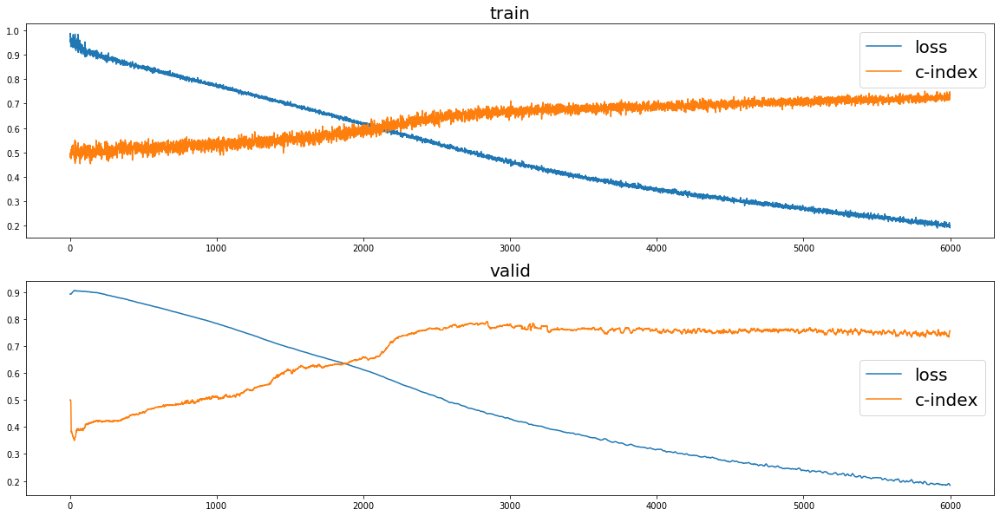

In [13]:
plt.figure(figsize = (20, 10))
plt.subplot(2, 1, 1)
plt.plot(train_result[:, 0]/4, label = 'loss')
plt.plot(train_result[:, 1], label = 'c-index')
plt.title('train', fontsize = 20)
plt.legend(fontsize = 20)

plt.subplot(2, 1, 2)
plt.plot(valid_result[:, 0]/4, label = 'loss')
plt.plot(valid_result[:, 1], label = 'c-index')
plt.title('valid', fontsize = 20)
plt.legend(fontsize = 20)


trainer.test()

In [25]:
import torch.nn as nn
class WrappedModel(nn.Module):
    def __init__(self, model):
        super(WrappedModel, self).__init__()
        self.model = model

    def forward(self, x):
        x = torch.tensor(x.to_numpy(), dtype=torch.float32).to(device)
        x = self.model(x)
        return x.detach().cpu().numpy()

    # Add the predict method
    def predict(self, x):
        return self.forward(x)

wrapped_model = WrappedModel(model)

In [26]:
feature_names = [f'feature_{i}' for i in range(1, 10)]
surv_XDF = pd.DataFrame(df[list(range(9))].to_numpy(), columns=feature_names)

In [27]:
surv_XDF

,feature_1,feature_2,feature_3,feature_4,feature_5,feature_6,feature_7,feature_8,feature_9
0,0.830508,0.057692,0.0,1.0,0.04,0.020168,1.0,0.0,0.153846
1,0.593220,0.067308,1.0,1.0,0.12,0.025630,1.0,0.0,0.076923
2,0.627119,0.236888,1.0,1.0,0.16,0.021849,1.0,0.0,0.273504
3,0.644068,0.025350,1.0,1.0,0.06,0.025210,1.0,0.0,0.119658
4,0.881356,0.056818,0.0,1.0,0.00,0.010924,1.0,0.0,0.273504
...,...,...,...,...,...,...,...,...,...
681,0.474576,0.073427,0.0,0.0,0.04,0.000420,0.0,1.0,0.230769
682,0.542373,0.000000,1.0,1.0,0.32,0.000000,0.0,1.0,0.188034
683,0.508475,0.000000,0.0,0.0,0.08,0.018067,0.0,1.0,0.188034
684,0.525424,0.029720,0.0,1.0,0.04,0.006303,1.0,0.0,0.170940


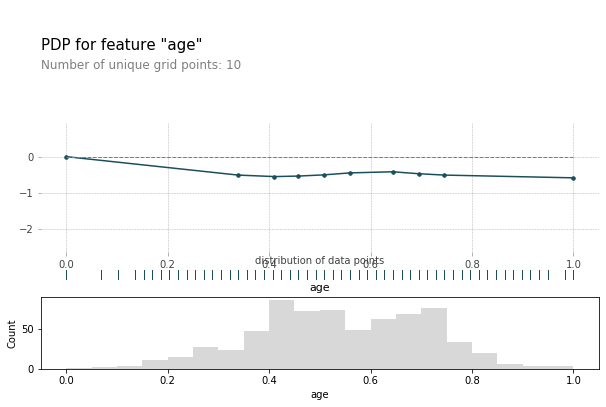

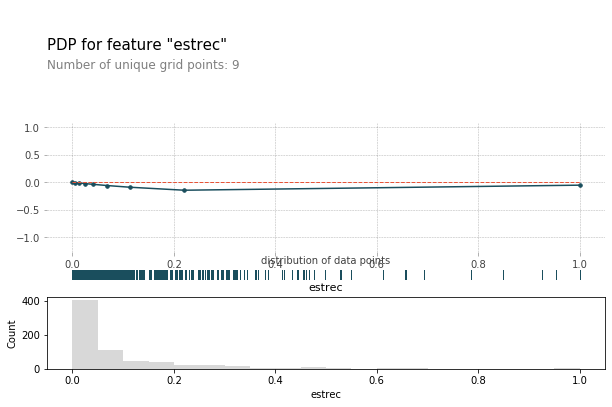

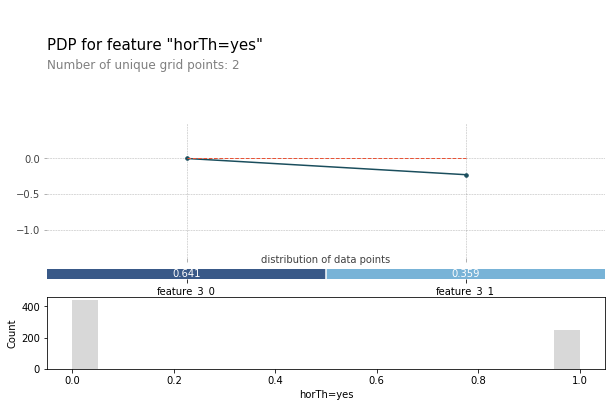

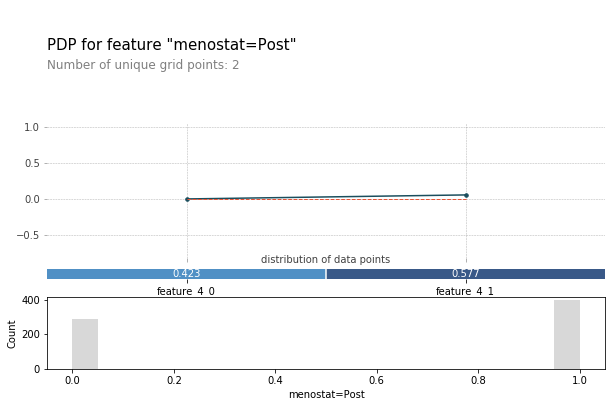

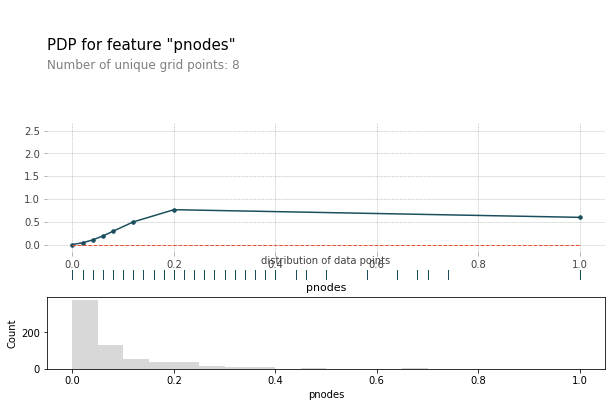

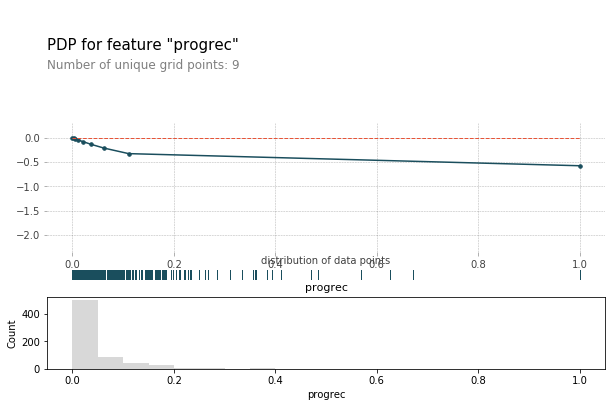

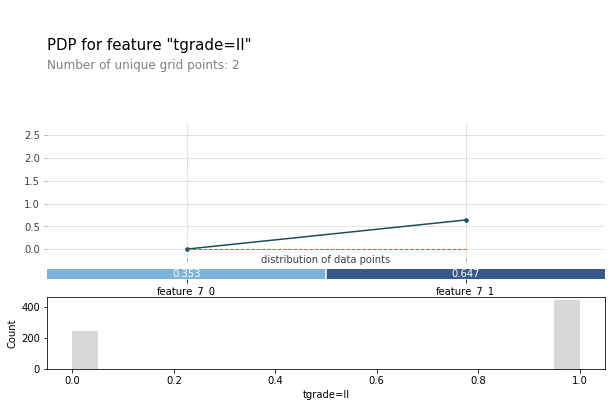

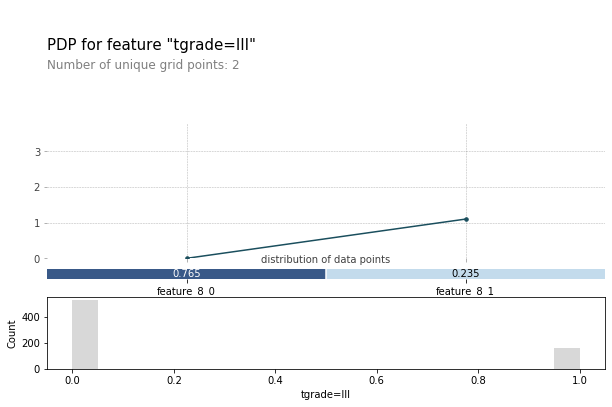

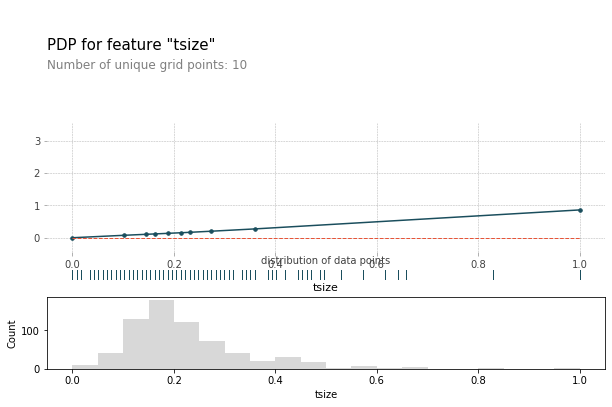

In [28]:
import matplotlib.pyplot as plt

from pdpbox.pdp import pdp_isolate, pdp_plot

# Generate the PDP plots with histograms below for all features
for i, feature in enumerate(feature_names, 1):
    pdp_feature = pdp_isolate(
        model=wrapped_model,
        dataset=surv_XDF,
        model_features=feature_names,
        feature=feature
    )
    fig, axes = pdp_plot(pdp_feature, cols[i-1], plot_lines=False, frac_to_plot=1, plot_pts_dist=True,figsize = (10,5), plot_params = {'fill_alpha': 0.0})

    # Add a histogram of the feature values below the PDP plot
    ax2 = fig.add_axes([fig.axes[-1].get_position().x0, fig.axes[-1].get_position().y0 - 0.25,
                        fig.axes[-1].get_position().width, 0.2])
    ax2.hist(surv_XDF[feature], bins=20, alpha=0.3, color='gray')
    ax2.set_xlabel(cols[i-1])
    ax2.set_ylabel('Count')
    plt.show()


In [29]:
'''
from PyALE import ale

import torch.nn as nn
from sklearn.base import BaseEstimator

# ... (all previous code up to WrappedModel definition remains the same)

import torch.nn as nn
class WrappedModel(nn.Module):
    def __init__(self, model):
        super(WrappedModel, self).__init__()
        self.model = model

    def forward(self, x):
        x = torch.tensor(x.to_numpy(), dtype=torch.float32).to(device)
        x = self.model(x)
        return x.detach().cpu().numpy()

    # Add the predict method
    def predict(self, x):
        return self.forward(x)

wrapped_model = WrappedModel(model)
def model_predict(X):
    return torch.log(wrapped_model.predict(X))

X_df = surv_XDF
def compute_ale(predict_fn, X, feature, bins=20):
    X_sorted = X.sort_values(by=feature)
    bin_edges = np.linspace(X_sorted[feature].min(), X_sorted[feature].max(), bins + 1)
    bin_centers = (bin_edges[:-1] + bin_edges[1:]) / 2
    ale_values = np.zeros(bins)

    for i in range(bins):
        subset = X_sorted[(X_sorted[feature] >= bin_edges[i]) & (X_sorted[feature] < bin_edges[i + 1])]
        if len(subset) == 0:
            continue
        ale_values[i] = predict_fn(subset).mean()
        if i > 0:
            modified_subset = subset.copy()
            modified_subset[feature] = bin_centers[i - 1]
            ale_values[i] -= predict_fn(modified_subset).mean()
    
    return bin_centers, np.cumsum(ale_values)


def plot_ale_with_bottom_histogram(predict_fn, X, feature,i, bins=20):
    bin_centers, ale_values = compute_ale(predict_fn, X, feature, bins)
    
    # Create the ALE plot and histogram in a 2-row grid
    fig, (ax1, ax2) = plt.subplots(nrows=2, ncols=1, sharex=True, gridspec_kw={'height_ratios': [3, 1]})
    fig.subplots_adjust(hspace=0.05)

    # ALE plot
    ax1.plot(bin_centers, ale_values, marker='o', label='ALE')
    ax1.set_ylabel(f'ALE')
    ax1.legend(loc='upper left')

    # Histogram (data distribution)
    ax2.hist(X[feature], bins=bins, alpha=0.3, color='gray', label='Data Distribution')
    ax2.set_xlabel(f'Feature: {cols[i-1]}')
    ax2.set_ylabel('Count')
    ax2.legend(loc='upper right')

    plt.show()

# Generate the ALE plots with histograms below for all features
for i, feature in enumerate(feature_names, 1):
    plot_ale_with_bottom_histogram(wrapped_model.predict, X_df, feature,i, bins=20)

'''

"\nfrom PyALE import ale\n\nimport torch.nn as nn\nfrom sklearn.base import BaseEstimator\n\n# ... (all previous code up to WrappedModel definition remains the same)\n\nimport torch.nn as nn\nclass WrappedModel(nn.Module):\n    def __init__(self, model):\n        super(WrappedModel, self).__init__()\n        self.model = model\n\n    def forward(self, x):\n        x = torch.tensor(x.to_numpy(), dtype=torch.float32).to(device)\n        x = self.model(x)\n        return x.detach().cpu().numpy()\n\n    # Add the predict method\n    def predict(self, x):\n        return self.forward(x)\n\nwrapped_model = WrappedModel(model)\ndef model_predict(X):\n    return torch.log(wrapped_model.predict(X))\n\nX_df = surv_XDF\ndef compute_ale(predict_fn, X, feature, bins=20):\n    X_sorted = X.sort_values(by=feature)\n    bin_edges = np.linspace(X_sorted[feature].min(), X_sorted[feature].max(), bins + 1)\n    bin_centers = (bin_edges[:-1] + bin_edges[1:]) / 2\n    ale_values = np.zeros(bins)\n\n    for 

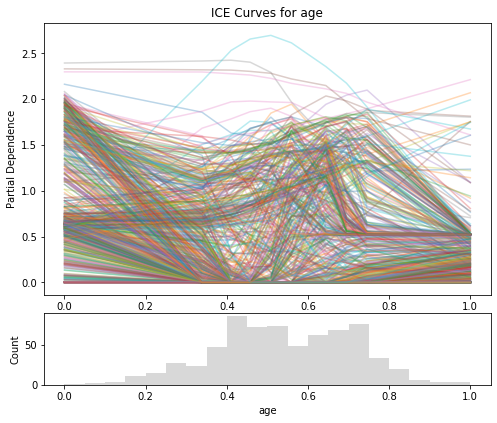

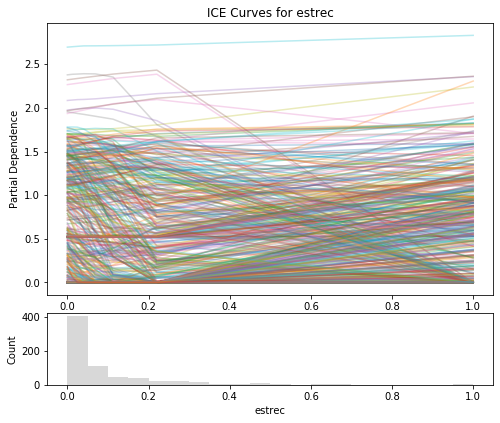

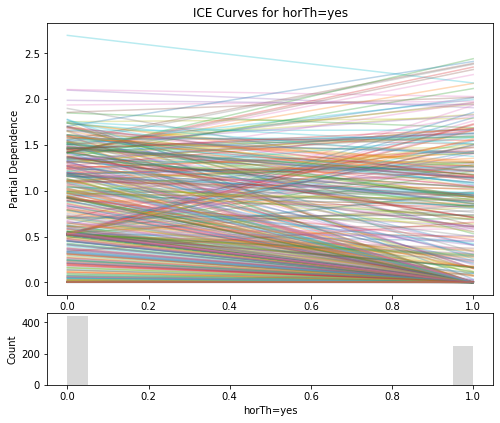

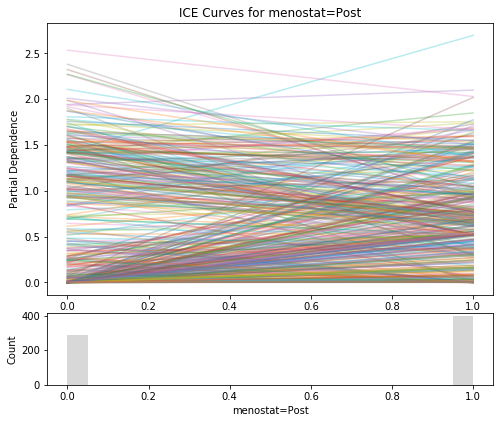

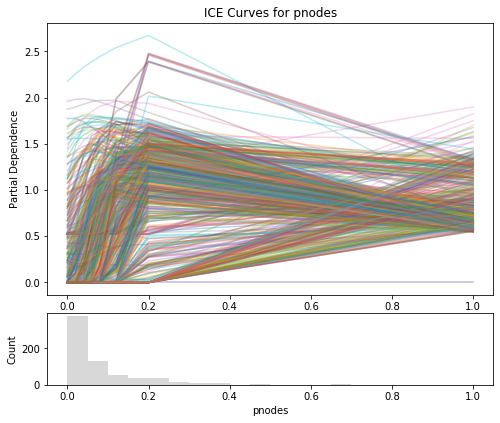

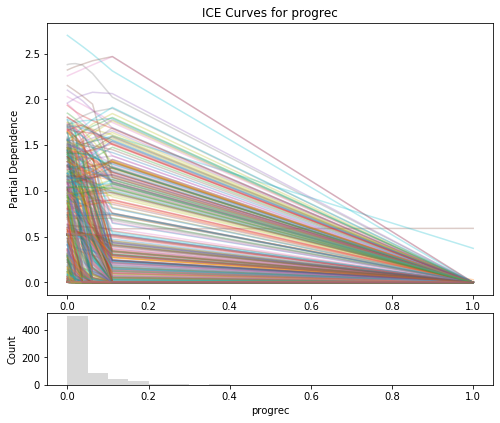

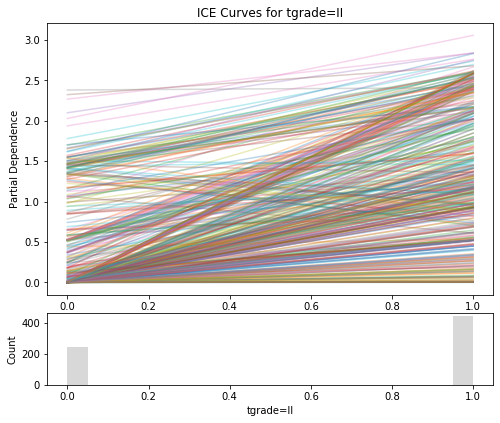

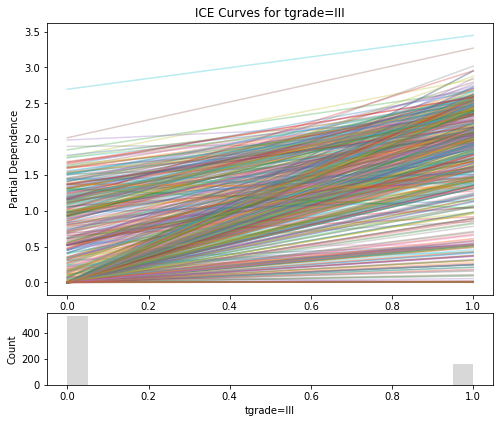

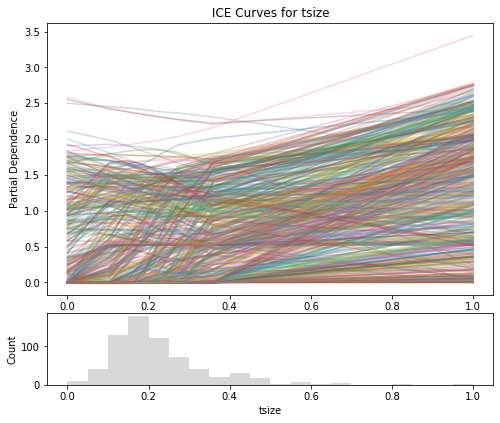

In [30]:
import numpy as np

def plot_ice(ice_data, feature_name, data, j):
    fig, ax1 = plt.subplots(figsize=(8, 5))

    ice_lines_array = ice_data.ice_lines.to_numpy()

    for i in range(ice_lines_array.shape[0]):
        ax1.plot(ice_data.feature_grids, ice_lines_array[i, :], alpha=0.3)

    ax1.set_xlabel(feature_name)
    ax1.set_ylabel('Partial Dependence')
    ax1.set_title(f'ICE Curves for {cols[j]}')

    # Add a histogram of the feature values below the ICE plot
    ax2 = fig.add_axes([ax1.get_position().x0, ax1.get_position().y0 - 0.25,
                        ax1.get_position().width, 0.2])
    ax2.hist(data[feature_name], bins=20, alpha=0.3, color='gray')
    ax2.set_xlabel(cols[j])
    ax2.set_ylabel('Count')

    plt.show()

# Choose the feature you want to plot
for j, selected_feature in enumerate(feature_names):
    # Generate the ICE data for the selected feature
    ice_feature = pdp_isolate(
        model=wrapped_model,
        dataset=surv_XDF,
        model_features=feature_names,
        feature=selected_feature
    )

    # Plot the ICE curves with the feature distribution
    plot_ice(ice_feature, selected_feature, surv_XDF, j)


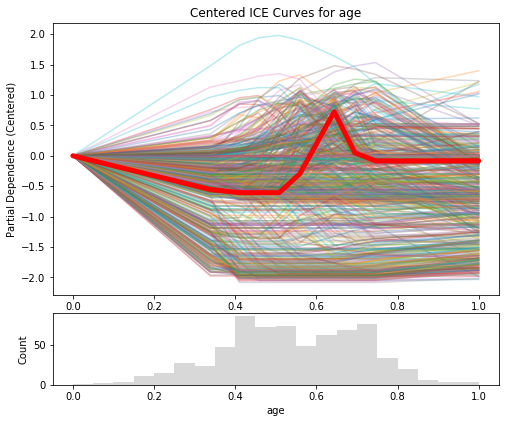

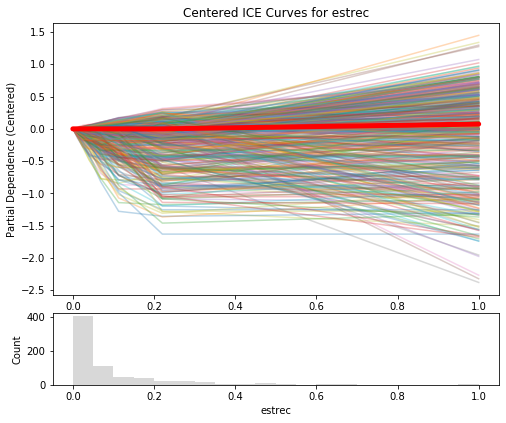

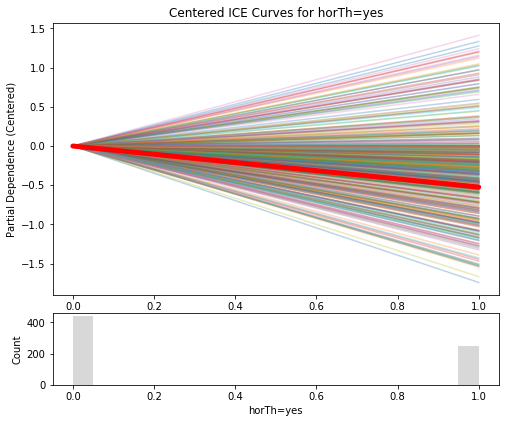

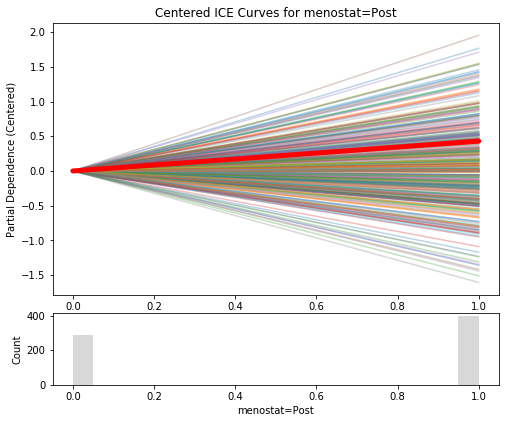

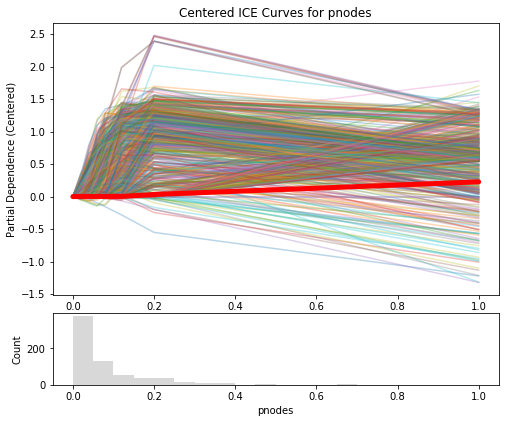

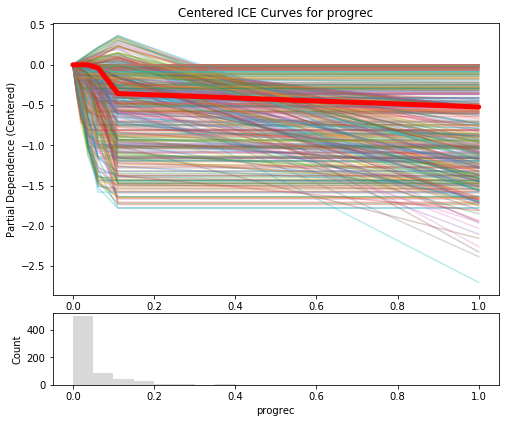

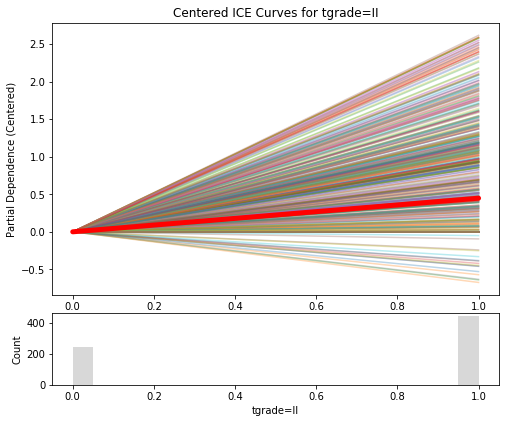

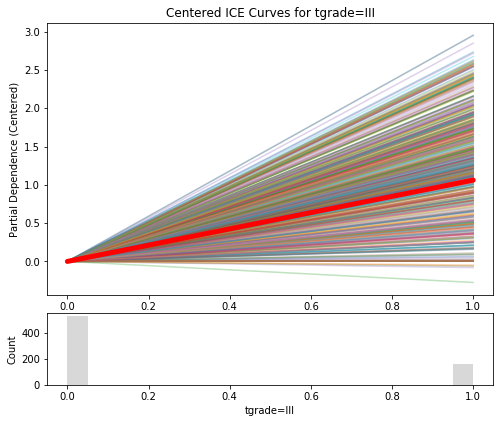

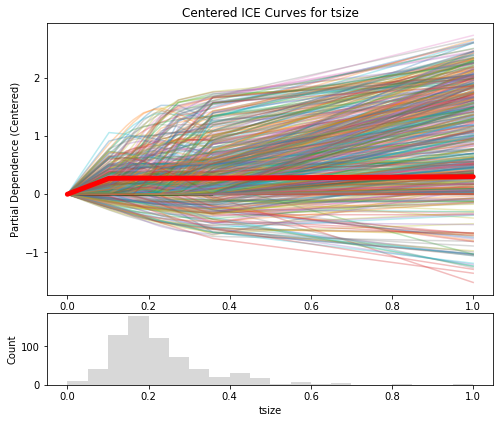

In [31]:
import numpy as np

def plot_ice(ice_data, feature_name, data,j, reference_value=None):
    fig, ax1 = plt.subplots(figsize=(8, 5))

    ice_lines_array = ice_data.ice_lines.to_numpy()

    # Choose the reference value as the first value in feature_grids if not provided
    if reference_value is None:
        reference_value = ice_data.feature_grids[0]

    # Find the index of the reference_value in feature_grids
    reference_index = np.argmin(np.abs(ice_data.feature_grids - reference_value))

    for i in range(ice_lines_array.shape[0]):
        centered_ice_line = ice_lines_array[i, :] - ice_lines_array[i, reference_index]
        ax1.plot(ice_data.feature_grids, centered_ice_line, alpha=0.3)
        if i == reference_index:
            refer_line = ice_lines_array[reference_index,]- ice_lines_array[i, reference_index]
    ax1.plot(ice_data.feature_grids, refer_line, linewidth = 5, color = 'r', linestyle='-', 
         solid_capstyle='round', solid_joinstyle='round')

    ax1.set_xlabel(feature_name)
    ax1.set_ylabel('Partial Dependence (Centered)')
    ax1.set_title(f'Centered ICE Curves for {cols[j]}')

    # Add a histogram of the feature values below the ICE plot
    ax2 = fig.add_axes([ax1.get_position().x0, ax1.get_position().y0 - 0.25,
                        ax1.get_position().width, 0.2])
    ax2.hist(data[feature_name], bins=20, alpha=0.3, color='gray')
    ax2.set_xlabel(cols[j])
    ax2.set_ylabel('Count')

    plt.show()

# Choose the feature you want to plot
for j, selected_feature in enumerate(feature_names):
# Generate the ICE data for the selected feature
    ice_feature = pdp_isolate(
        model=wrapped_model,
        dataset=surv_XDF,
        model_features=feature_names,
        feature=selected_feature
    )

    # Plot the centered ICE curves with the feature distribution
    plot_ice(ice_feature, selected_feature, surv_XDF, j)


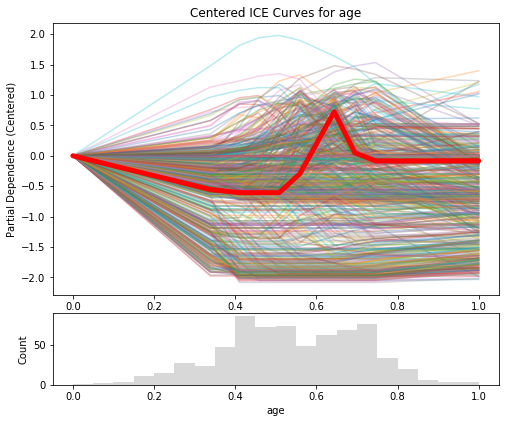

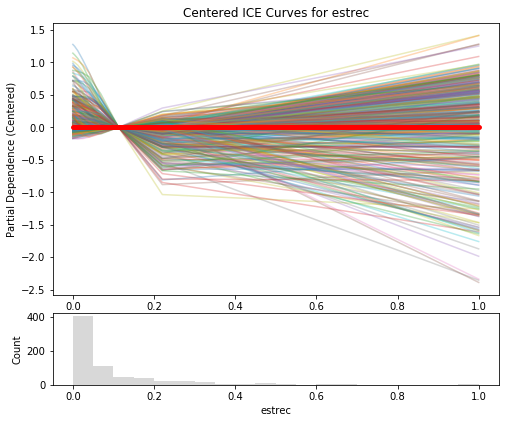

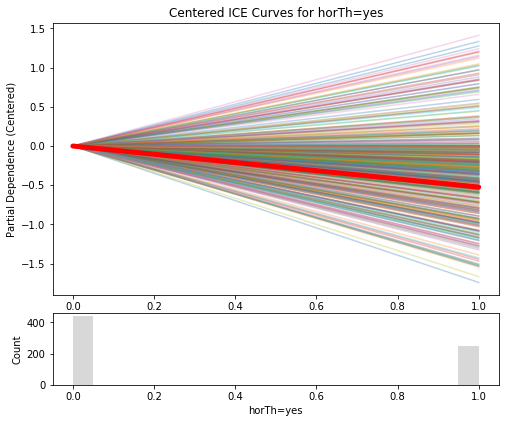

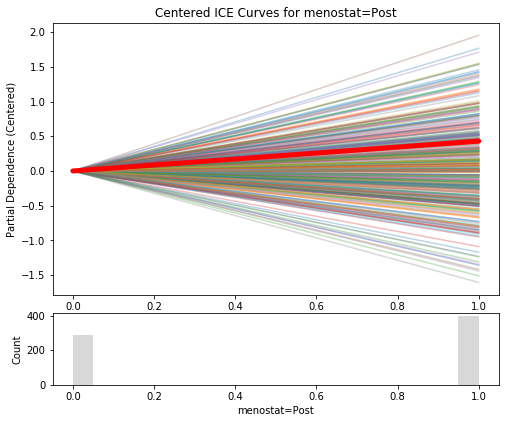

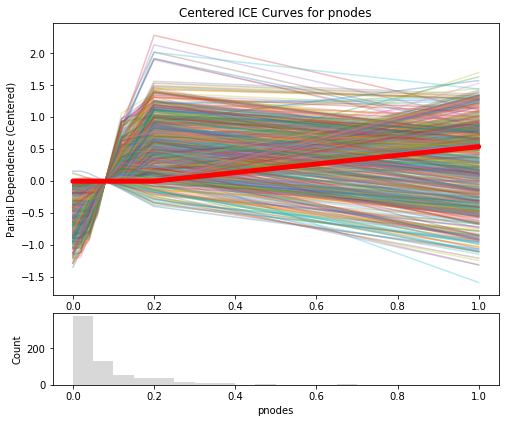

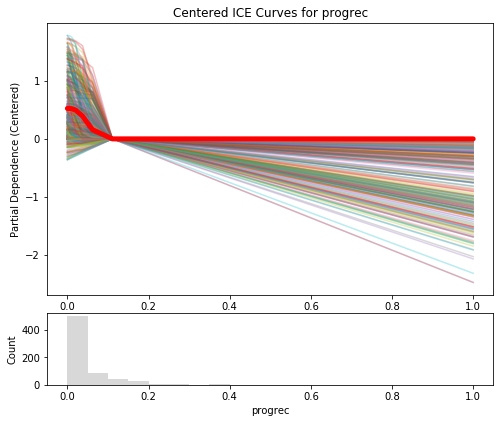

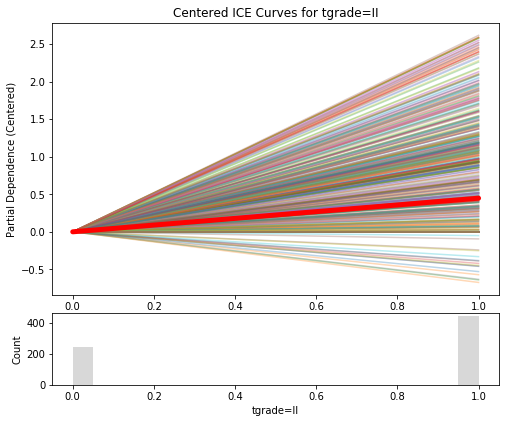

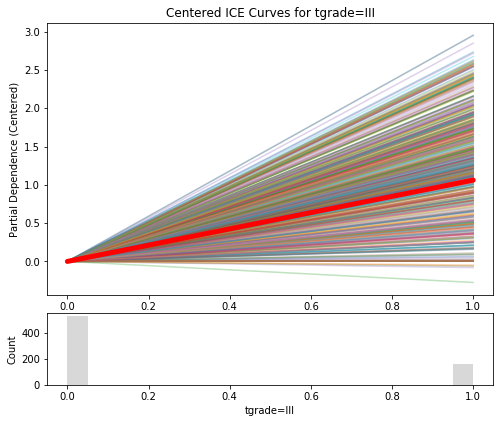

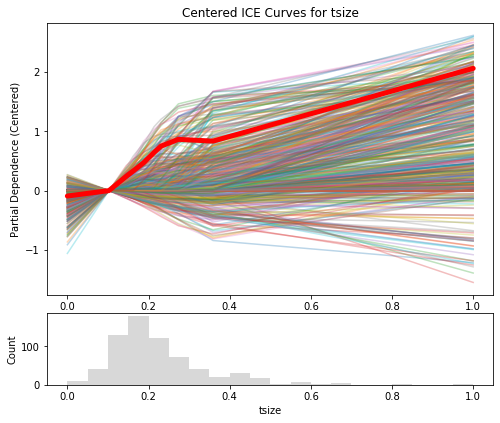

In [32]:
for j, selected_feature in enumerate(feature_names):
    # Generate the ICE data for the selected feature
    ice_feature = pdp_isolate(
        model=wrapped_model,
        dataset=surv_XDF,
        model_features=feature_names,
        feature=selected_feature
    )

    # Plot the centered ICE curves with the feature distribution
    plot_ice(ice_feature, selected_feature, surv_XDF, j, 0.1)

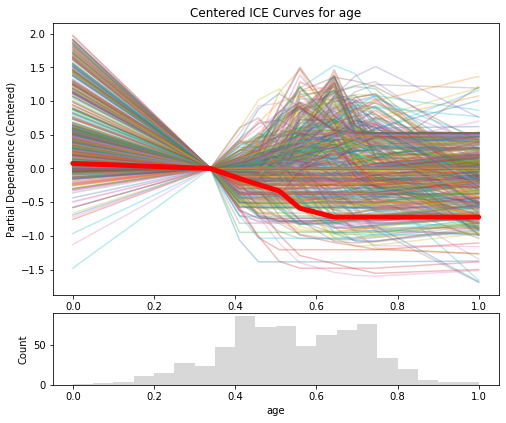

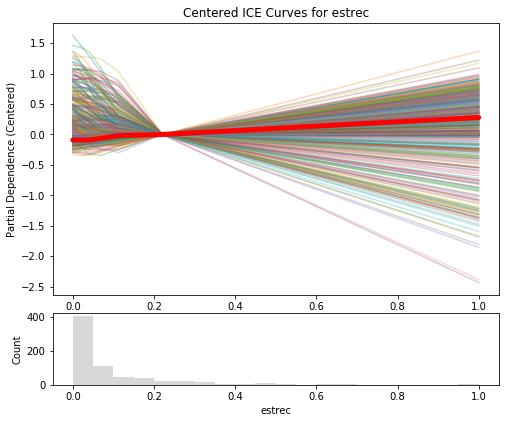

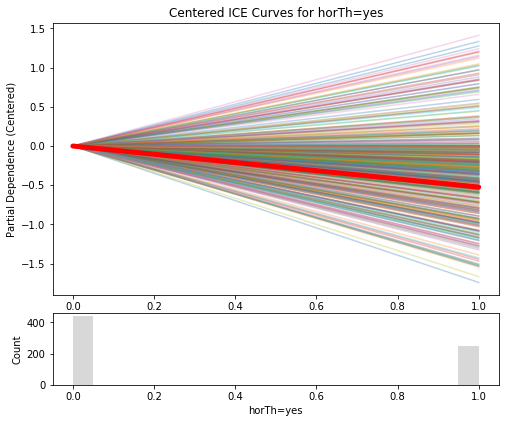

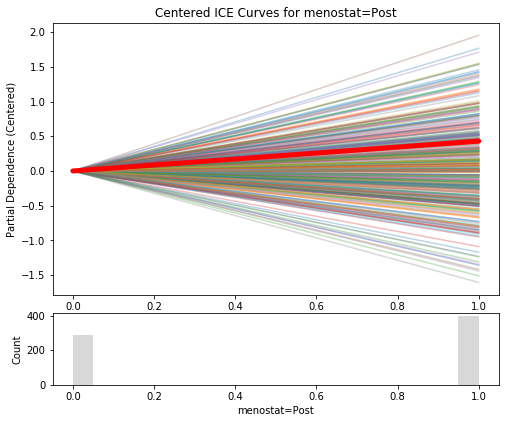

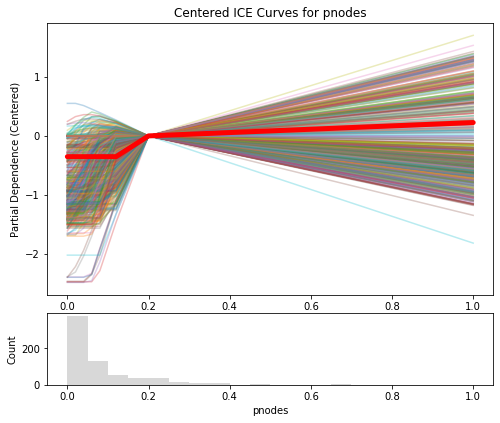

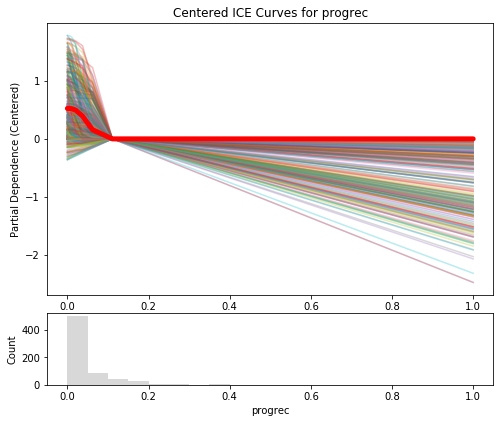

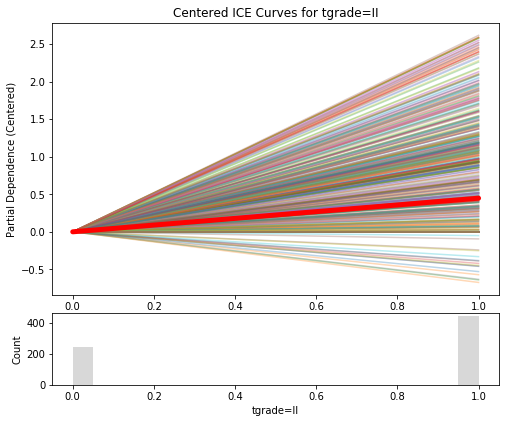

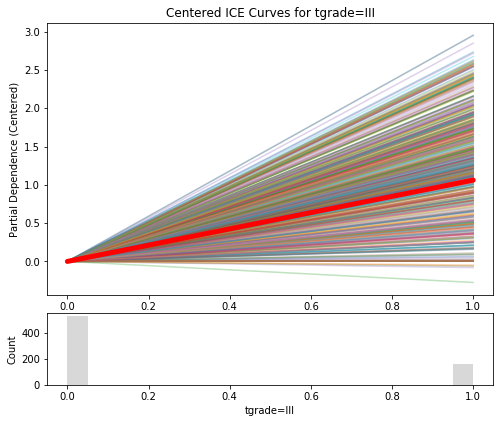

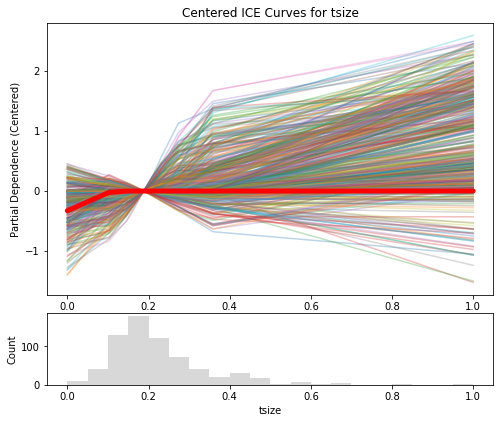

In [33]:
for j, selected_feature in enumerate(feature_names):
    # Generate the ICE data for the selected feature
    ice_feature = pdp_isolate(
        model=wrapped_model,
        dataset=surv_XDF,
        model_features=feature_names,
        feature=selected_feature
    )

    # Plot the centered ICE curves with the feature distribution
    plot_ice(ice_feature, selected_feature, surv_XDF, j, 0.2)

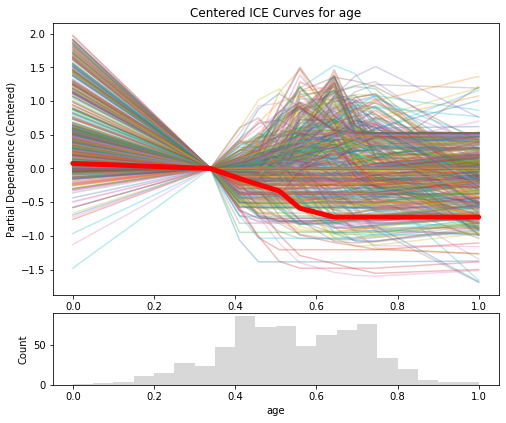

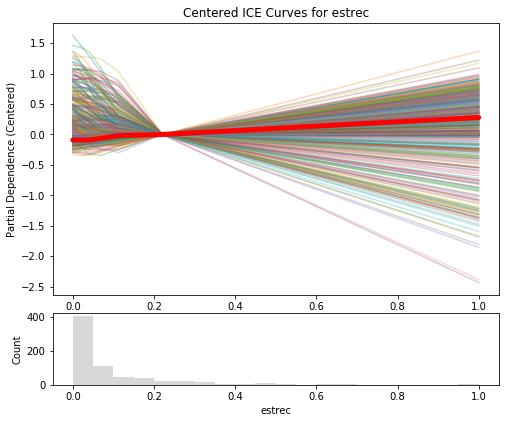

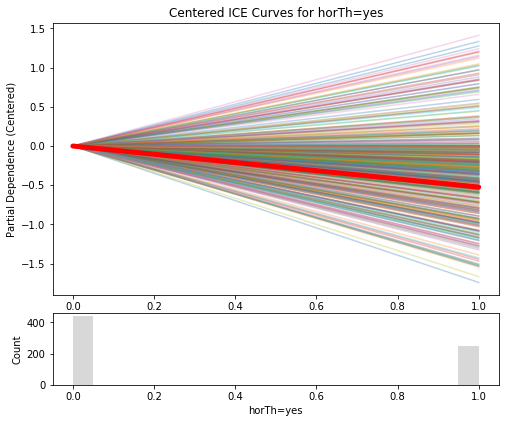

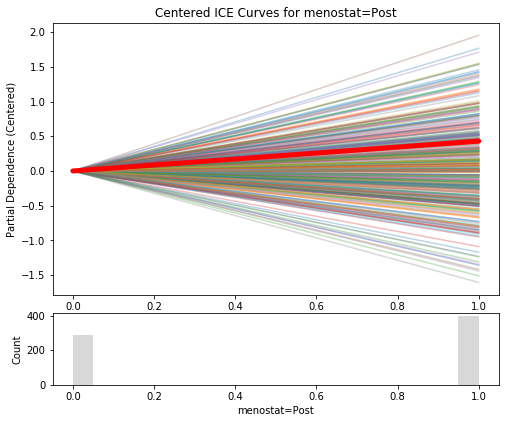

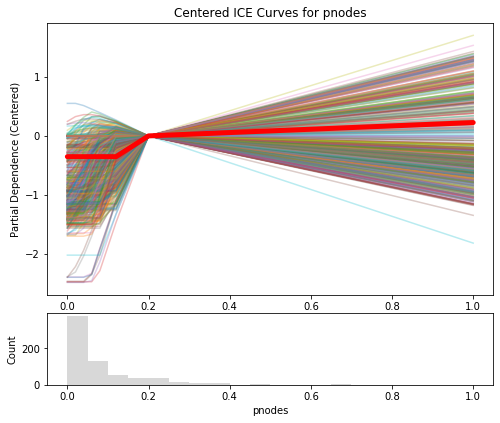

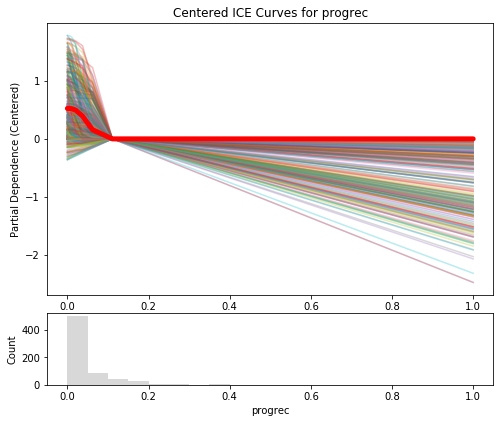

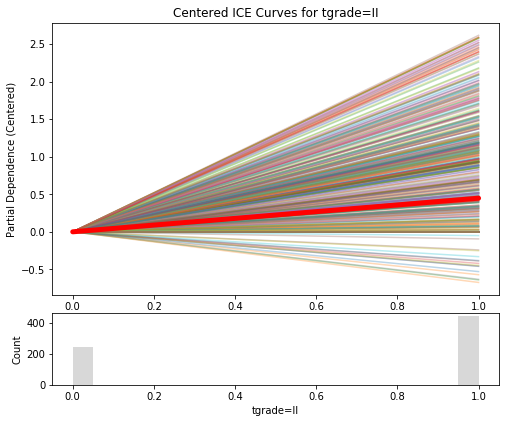

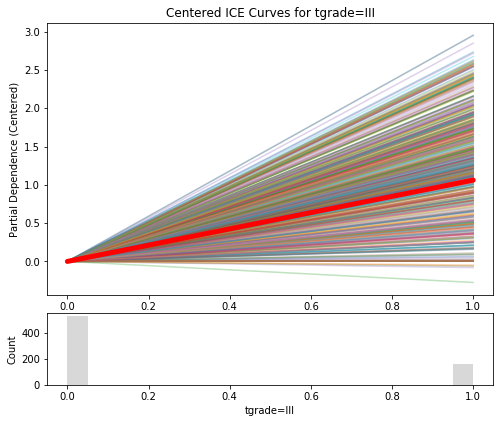

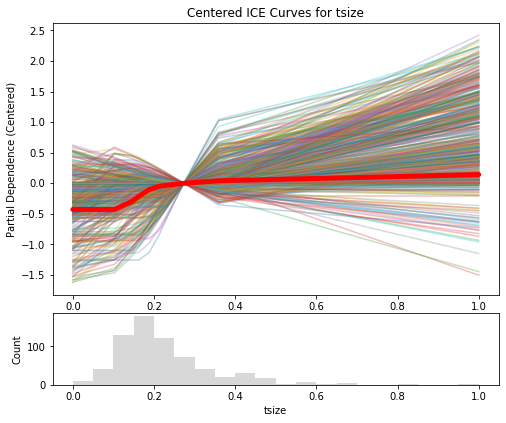

In [34]:
for j, selected_feature in enumerate(feature_names):
    # Generate the ICE data for the selected feature
    ice_feature = pdp_isolate(
        model=wrapped_model,
        dataset=surv_XDF,
        model_features=feature_names,
        feature=selected_feature
    )

    # Plot the centered ICE curves with the feature distribution
    plot_ice(ice_feature, selected_feature, surv_XDF, j, 0.3)

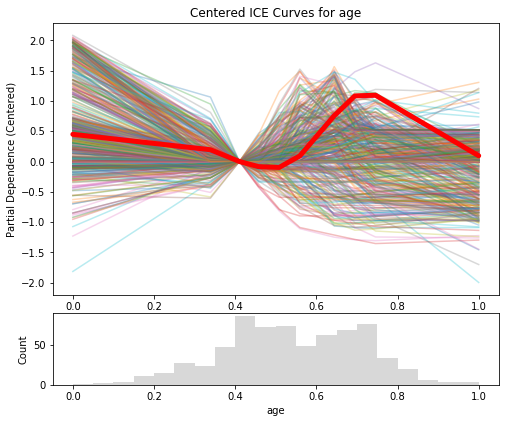

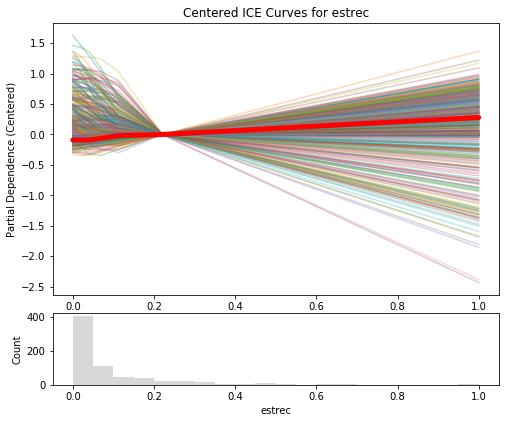

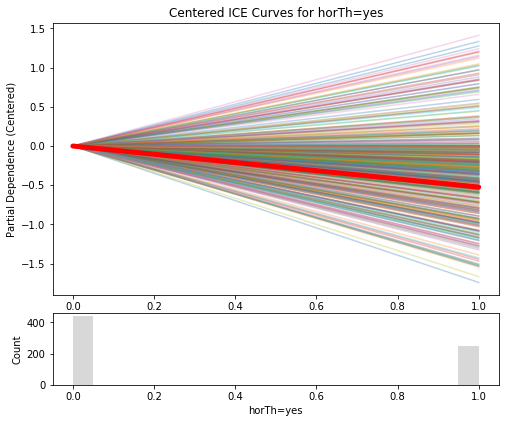

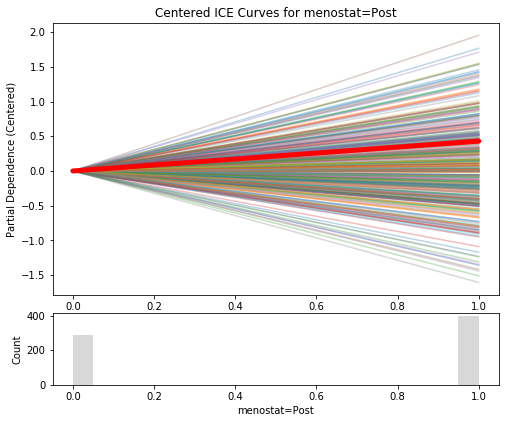

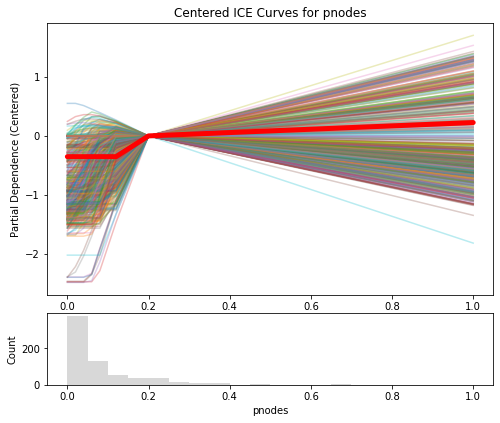

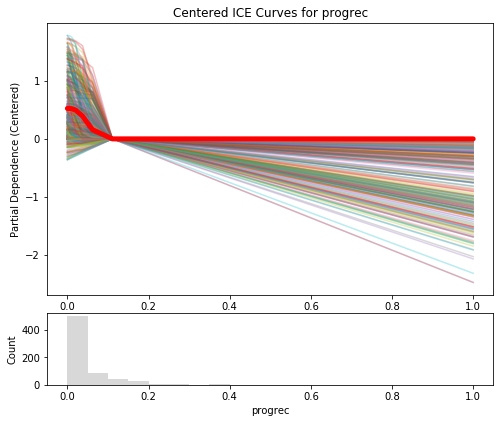

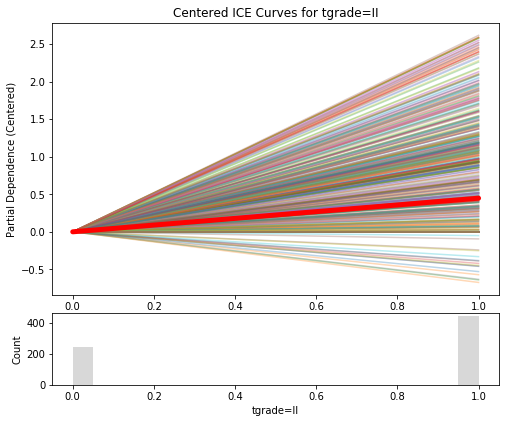

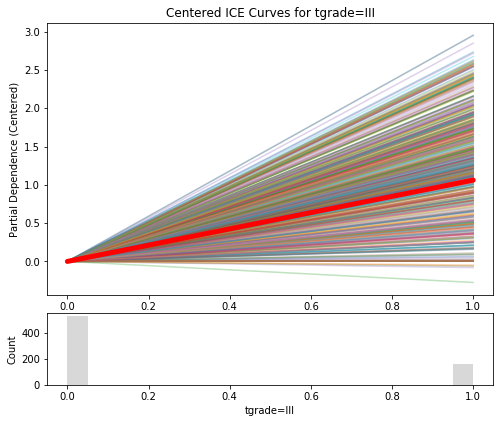

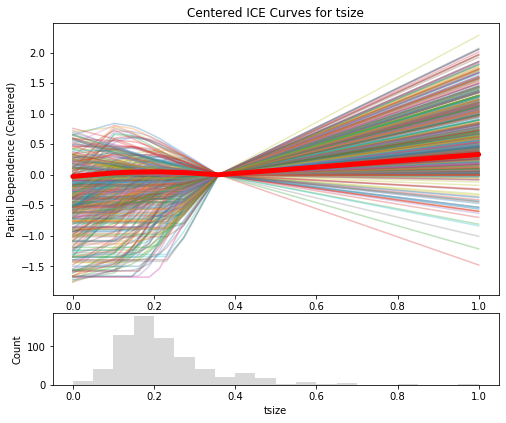

In [35]:
for j, selected_feature in enumerate(feature_names):
    # Generate the ICE data for the selected feature
    ice_feature = pdp_isolate(
        model=wrapped_model,
        dataset=surv_XDF,
        model_features=feature_names,
        feature=selected_feature
    )

    # Plot the centered ICE curves with the feature distribution
    plot_ice(ice_feature, selected_feature, surv_XDF, j, 0.4)

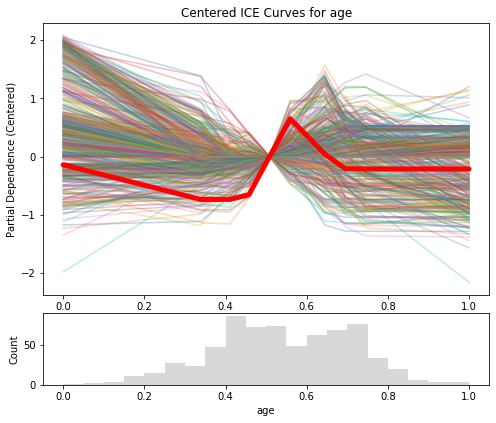

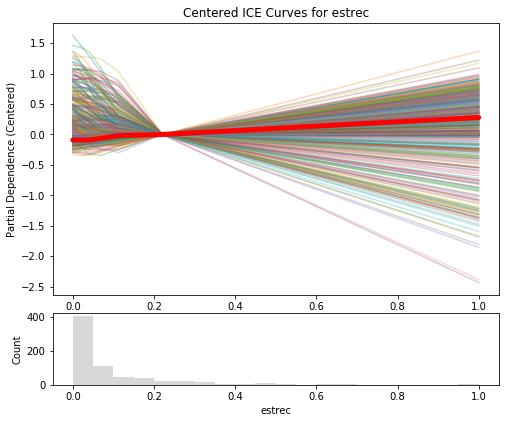

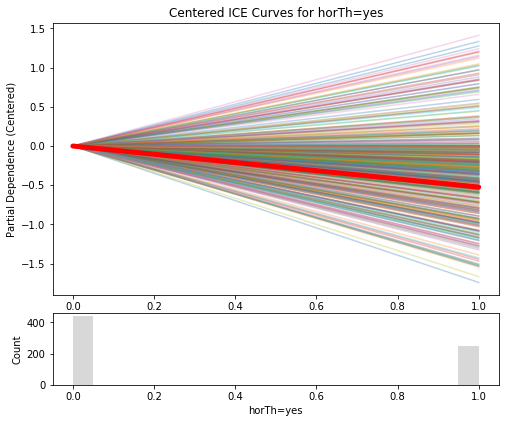

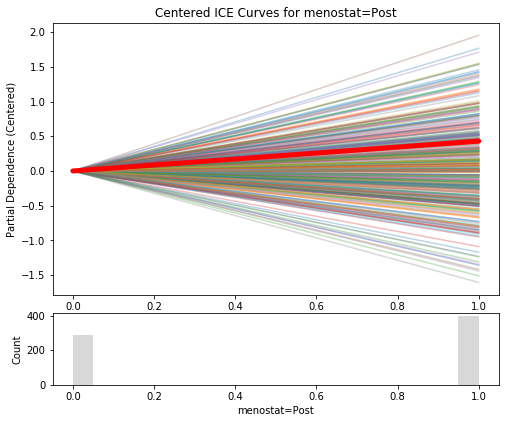

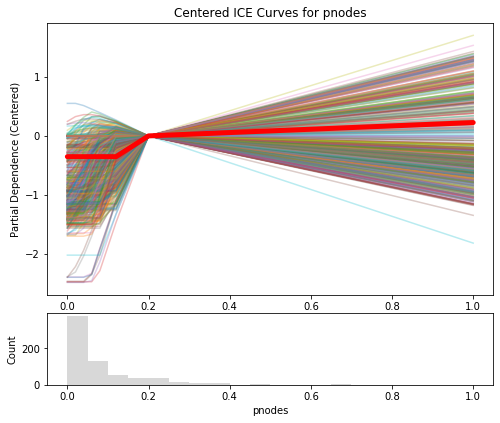

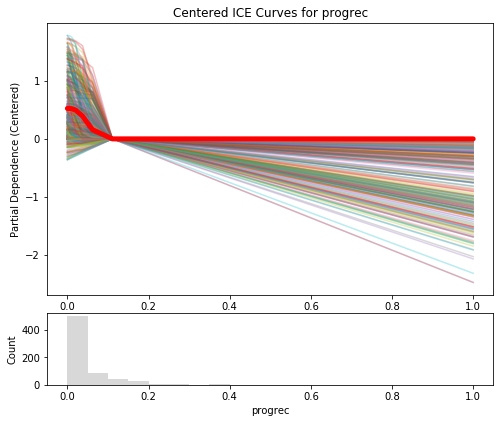

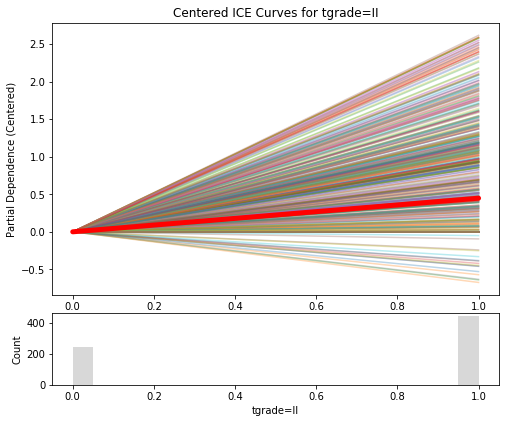

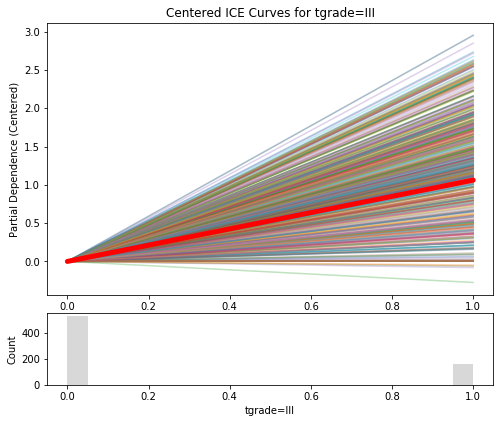

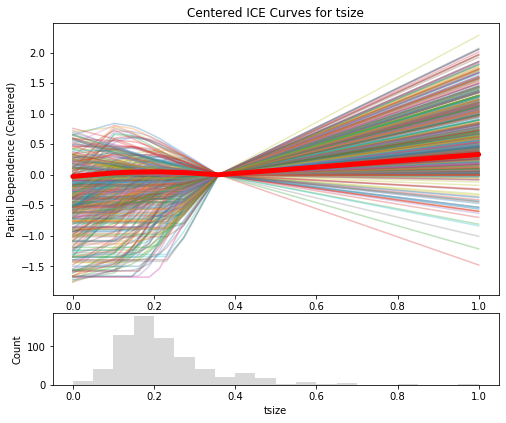

In [36]:
for j, selected_feature in enumerate(feature_names):
    # Generate the ICE data for the selected feature
    ice_feature = pdp_isolate(
        model=wrapped_model,
        dataset=surv_XDF,
        model_features=feature_names,
        feature=selected_feature
    )

    # Plot the centered ICE curves with the feature distribution
    plot_ice(ice_feature, selected_feature, surv_XDF, j, 0.5)

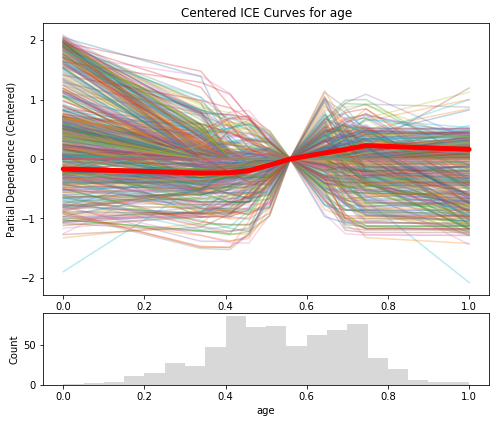

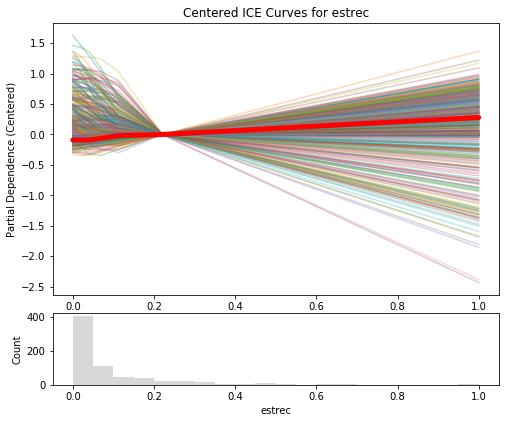

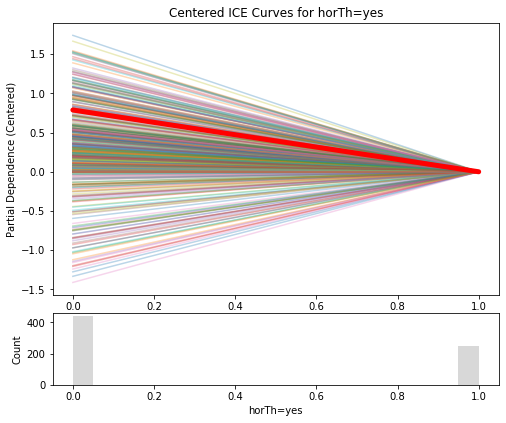

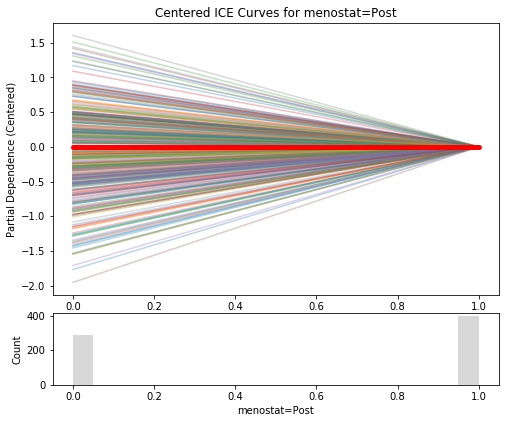

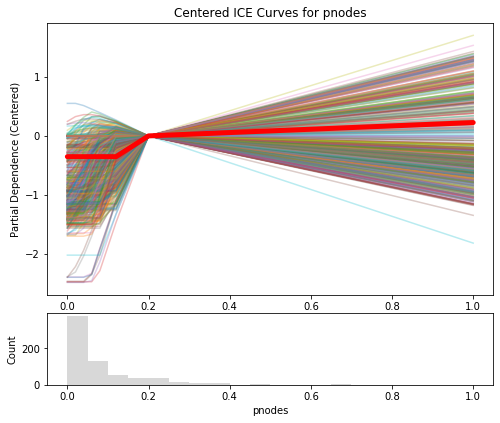

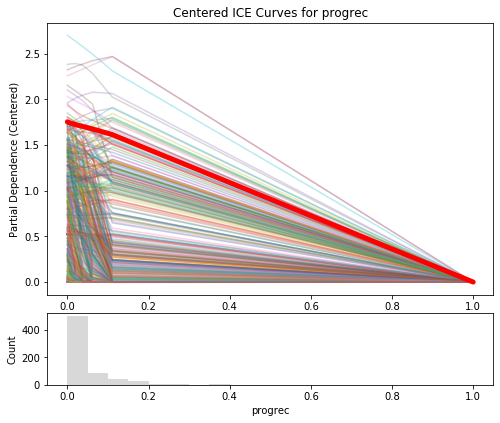

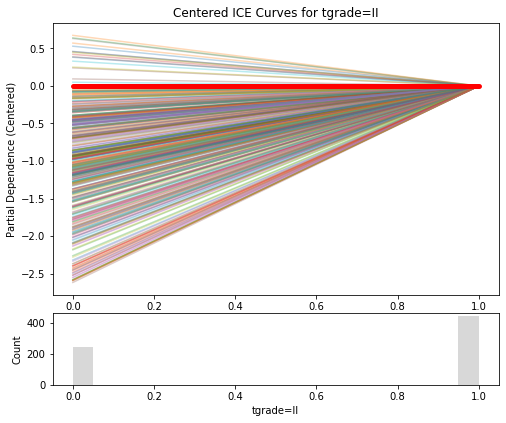

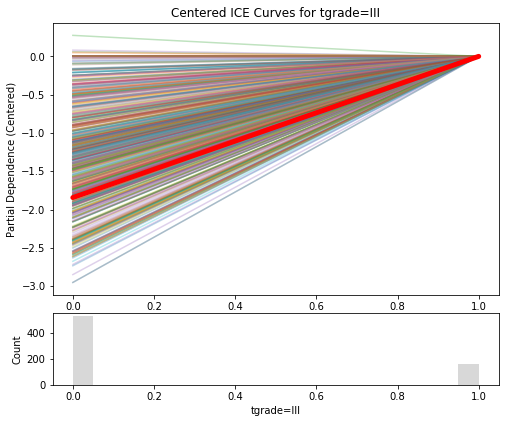

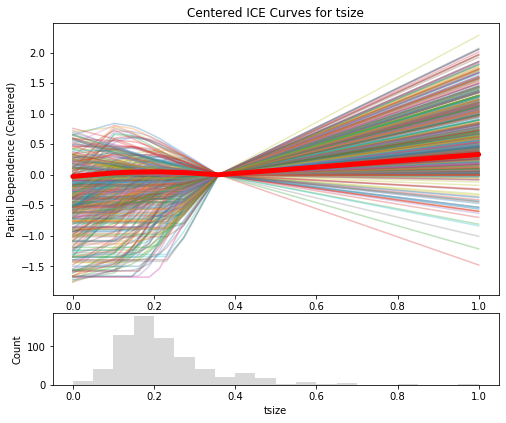

In [37]:
for j, selected_feature in enumerate(feature_names):
    # Generate the ICE data for the selected feature
    ice_feature = pdp_isolate(
        model=wrapped_model,
        dataset=surv_XDF,
        model_features=feature_names,
        feature=selected_feature
    )

    # Plot the centered ICE curves with the feature distribution
    plot_ice(ice_feature, selected_feature, surv_XDF, j, 0.6)

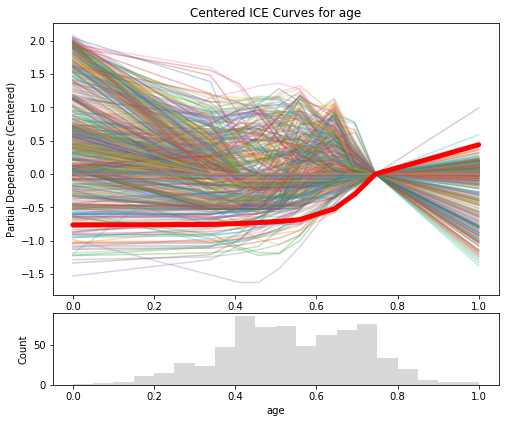

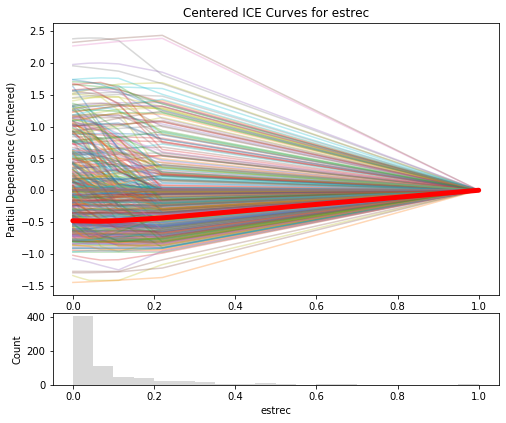

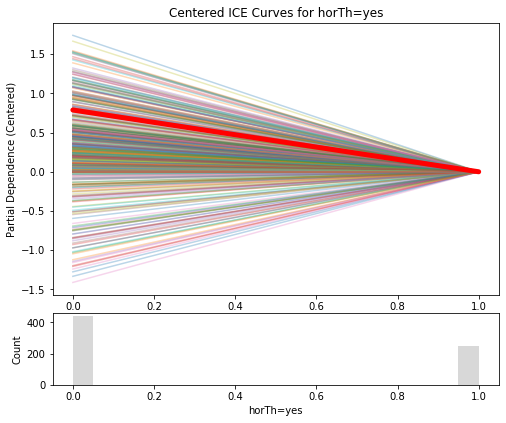

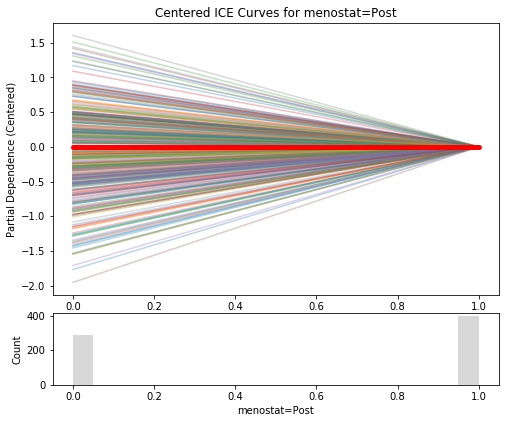

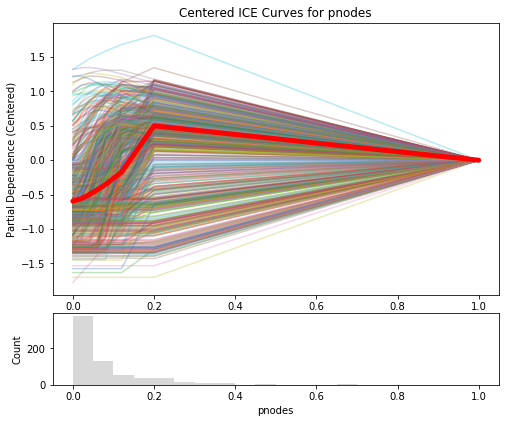

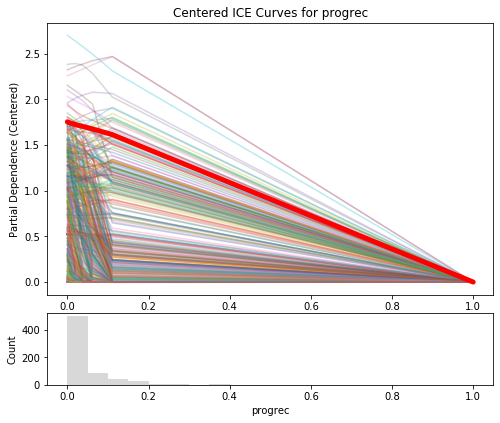

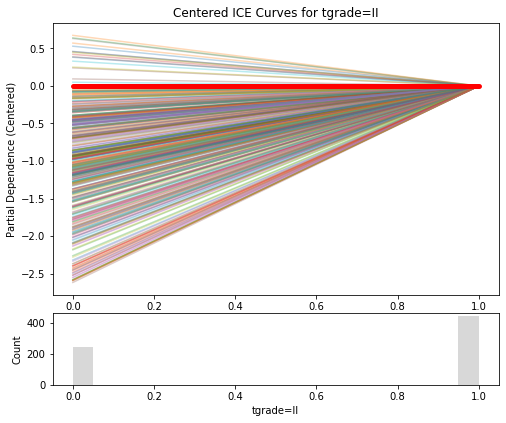

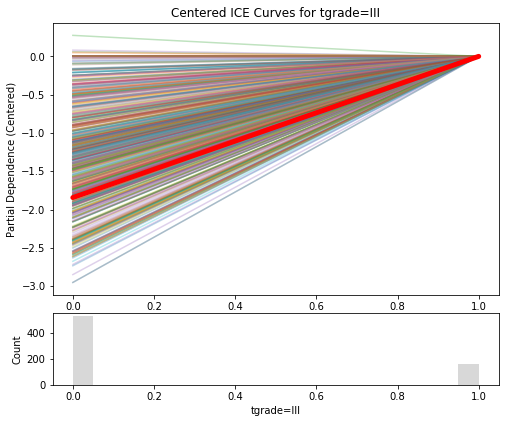

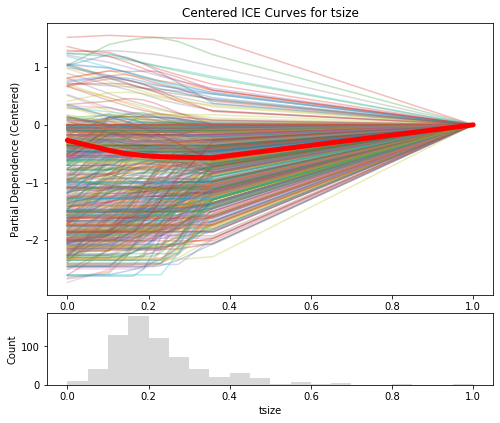

In [38]:
for j, selected_feature in enumerate(feature_names):
    # Generate the ICE data for the selected feature
    ice_feature = pdp_isolate(
        model=wrapped_model,
        dataset=surv_XDF,
        model_features=feature_names,
        feature=selected_feature
    )

    # Plot the centered ICE curves with the feature distribution
    plot_ice(ice_feature, selected_feature, surv_XDF, j, 0.8)

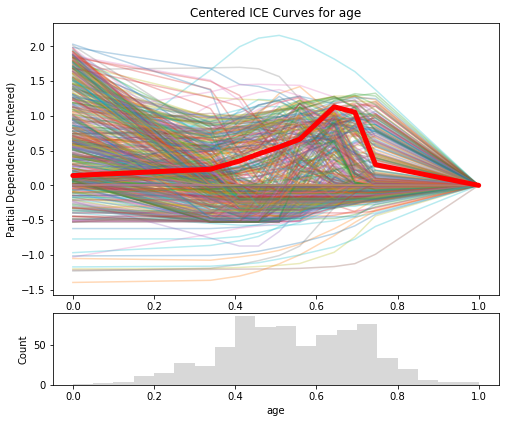

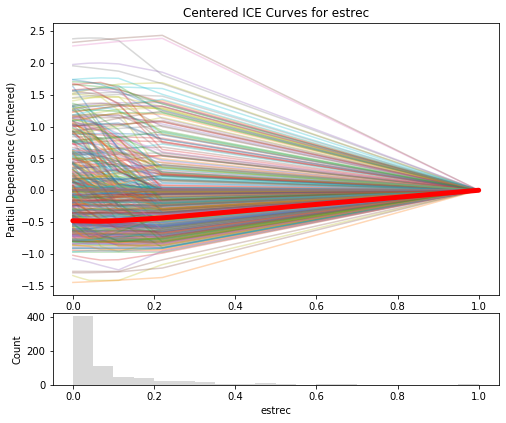

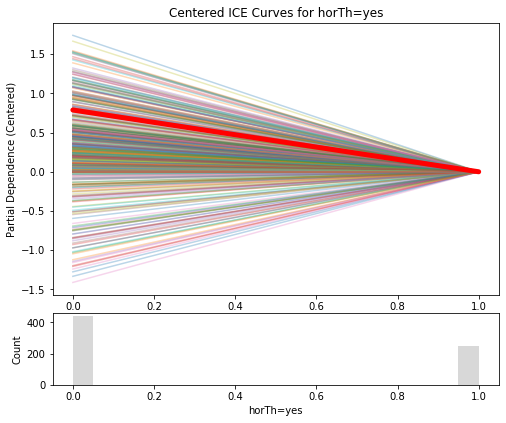

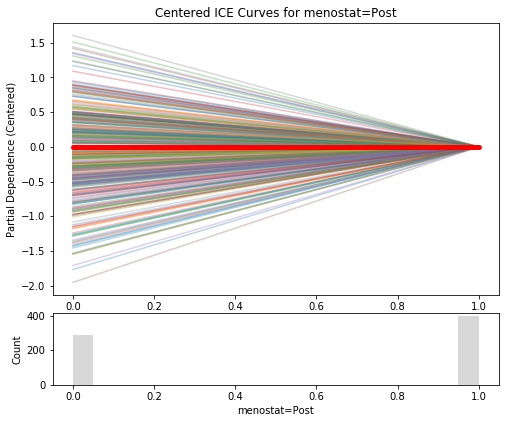

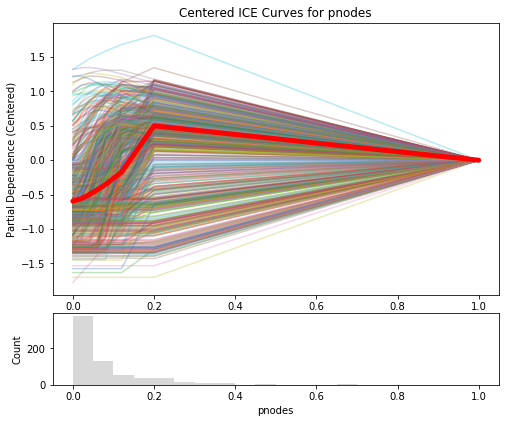

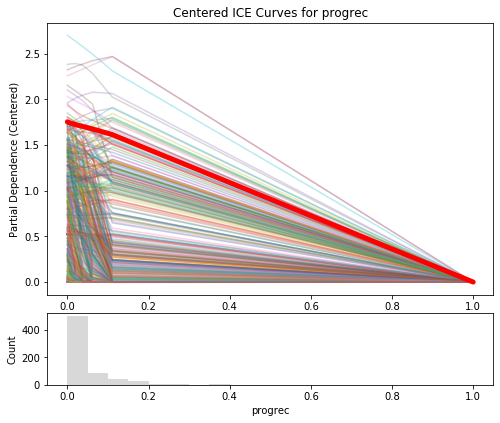

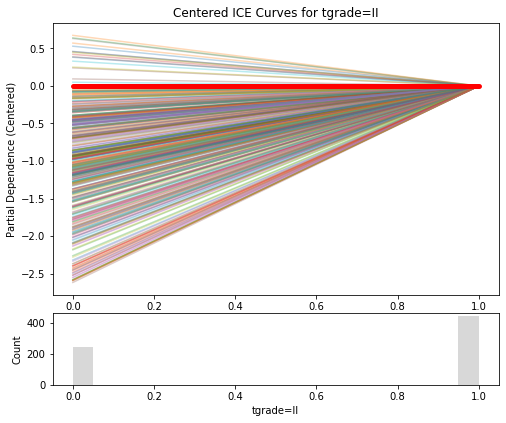

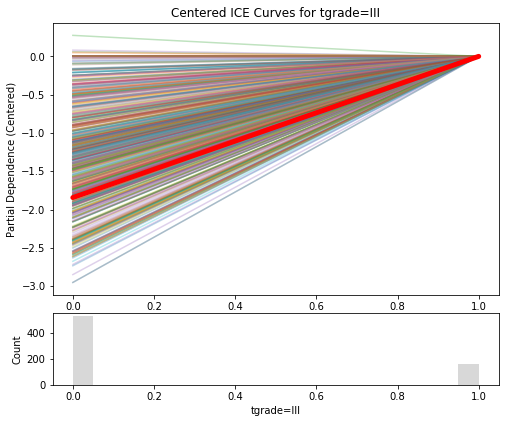

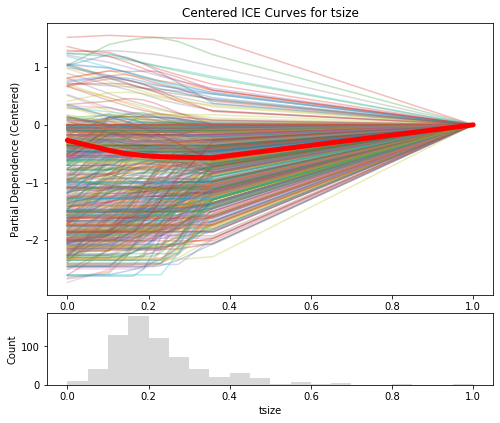

In [39]:
for j, selected_feature in enumerate(feature_names):
    # Generate the ICE data for the selected feature
    ice_feature = pdp_isolate(
        model=wrapped_model,
        dataset=surv_XDF,
        model_features=feature_names,
        feature=selected_feature
    )

    # Plot the centered ICE curves with the feature distribution
    plot_ice(ice_feature, selected_feature, surv_XDF, j, 1.0)